In [30]:
import pandas as pd
import numpy as np
%matplotlib inline

In [31]:
train=pd.read_excel("Data_Train.xlsx")

In [32]:
test=pd.read_excel("Test_set.xlsx")

In [33]:
df=pd.concat([train,test],ignore_index=True)

In [34]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897.0
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662.0
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882.0
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218.0
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302.0


In [35]:
df.shape

(13354, 11)

In [36]:
df.dtypes

Airline             object
Date_of_Journey     object
Source              object
Destination         object
Route               object
Dep_Time            object
Arrival_Time        object
Duration            object
Total_Stops         object
Additional_Info     object
Price              float64
dtype: object

In [37]:
from pandas_profiling import ProfileReport

In [38]:
profile = ProfileReport(df, title="Pandas Profiling Report")

In [39]:
profile

In [40]:
df.isna().sum()

Airline               0
Date_of_Journey       0
Source                0
Destination           0
Route                 1
Dep_Time              0
Arrival_Time          0
Duration              0
Total_Stops           1
Additional_Info       0
Price              2671
dtype: int64

In [41]:
df.dropna(inplace=True)

In [42]:
df.isna().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
Price              0
dtype: int64

In [43]:
df.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897.0
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662.0
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882.0
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218.0
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302.0


In [44]:
df[df.duplicated()]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
683,Jet Airways,1/06/2019,Delhi,Cochin,DEL → NAG → BOM → COK,14:35,04:25 02 Jun,13h 50m,2 stops,No info,13376.0
1061,Air India,21/05/2019,Delhi,Cochin,DEL → GOI → BOM → COK,22:00,19:15 22 May,21h 15m,2 stops,No info,10231.0
1348,Air India,18/05/2019,Delhi,Cochin,DEL → HYD → BOM → COK,17:15,19:15 19 May,26h,2 stops,No info,12392.0
1418,Jet Airways,6/06/2019,Delhi,Cochin,DEL → JAI → BOM → COK,05:30,04:25 07 Jun,22h 55m,2 stops,In-flight meal not included,10368.0
1674,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,18:25,21:20,2h 55m,non-stop,No info,7303.0
...,...,...,...,...,...,...,...,...,...,...,...
10594,Jet Airways,27/06/2019,Delhi,Cochin,DEL → AMD → BOM → COK,23:05,12:35 28 Jun,13h 30m,2 stops,No info,12819.0
10616,Jet Airways,1/06/2019,Delhi,Cochin,DEL → JAI → BOM → COK,09:40,12:35 02 Jun,26h 55m,2 stops,No info,13014.0
10634,Jet Airways,6/06/2019,Delhi,Cochin,DEL → JAI → BOM → COK,09:40,12:35 07 Jun,26h 55m,2 stops,In-flight meal not included,11733.0
10672,Jet Airways,27/06/2019,Delhi,Cochin,DEL → AMD → BOM → COK,23:05,19:00 28 Jun,19h 55m,2 stops,In-flight meal not included,11150.0


In [45]:
df.drop_duplicates(keep='first',inplace=True)

In [46]:
df["Additional_Info"].value_counts()

No info                         8182
In-flight meal not included     1926
No check-in baggage included     318
1 Long layover                    19
Change airports                    7
Business class                     4
No Info                            3
Red-eye flight                     1
1 Short layover                    1
2 Long layover                     1
Name: Additional_Info, dtype: int64

In [47]:
df["Additional_Info"]=df["Additional_Info"].replace("No Info","No info")

In [48]:
df["Additional_Info"].nunique()

9

In [49]:
df["Source"].value_counts()

Delhi       4345
Kolkata     2860
Banglore    2179
Mumbai       697
Chennai      381
Name: Source, dtype: int64

In [50]:
df["Destination"].value_counts()

Cochin       4345
Banglore     2860
Delhi        1265
New Delhi     914
Hyderabad     697
Kolkata       381
Name: Destination, dtype: int64

In [51]:
df["Destination"]=df["Destination"].replace("New Delhi","Delhi")

In [52]:
df["Total_Stops"].value_counts()

1 stop      5625
non-stop    3475
2 stops     1318
3 stops       43
4 stops        1
Name: Total_Stops, dtype: int64

In [53]:
df["Total_Stops"]=df["Total_Stops"].str.split(" ").str[0]

In [54]:
df["Total_Stops"].value_counts()

1           5625
non-stop    3475
2           1318
3             43
4              1
Name: Total_Stops, dtype: int64

In [55]:
df["Total_Stops"]=df["Total_Stops"].replace("non-stop",0)

In [56]:
df["Total_Stops"].value_counts()

1    5625
0    3475
2    1318
3      43
4       1
Name: Total_Stops, dtype: int64

In [57]:
df["Total_Stops"] = df["Total_Stops"].astype(int)

In [62]:
df["isWeekend"] = ((pd.to_datetime(df["Date_of_Journey"]).dt.dayofweek) // 5 == 1).astype(int)

In [63]:
df["isWeekend"]

0        1
1        1
2        0
3        0
4        0
        ..
10678    0
10679    1
10680    1
10681    0
10682    0
Name: isWeekend, Length: 10462, dtype: int64

In [64]:
df[["Date_of_Journey"]] = df[["Date_of_Journey"]].apply(pd.to_datetime)

In [65]:
df['month'] = pd.DatetimeIndex(df['Date_of_Journey']).month
df['year'] = pd.DatetimeIndex(df['Date_of_Journey']).year
df['day'] = pd.DatetimeIndex(df['Date_of_Journey']).day

In [66]:
df.drop(columns='Date_of_Journey',inplace=True)

In [67]:
df.head(3)

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,isWeekend,month,year,day
0,IndiGo,Banglore,Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,0,No info,3897.0,1,3,2019,24
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2,No info,7662.0,1,1,2019,5
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2,No info,13882.0,0,9,2019,6


In [68]:
df.dtypes

Airline             object
Source              object
Destination         object
Route               object
Dep_Time            object
Arrival_Time        object
Duration            object
Total_Stops          int64
Additional_Info     object
Price              float64
isWeekend            int64
month                int64
year                 int64
day                  int64
dtype: object

In [69]:
df["Arrival_Time"]=df["Arrival_Time"].str.split(" ").str[0]

In [70]:
df.head()

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,isWeekend,month,year,day
0,IndiGo,Banglore,Delhi,BLR → DEL,22:20,01:10,2h 50m,0,No info,3897.0,1,3,2019,24
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2,No info,7662.0,1,1,2019,5
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25,19h,2,No info,13882.0,0,9,2019,6
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1,No info,6218.0,0,12,2019,5
4,IndiGo,Banglore,Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1,No info,13302.0,0,1,2019,3


In [71]:


df["dep_hour"]=df["Dep_Time"].str.split(":").str[0]

In [72]:
df["dep_min"]=df["Dep_Time"].str.split(":").str[1]

In [73]:
df["arr_hour"]=df["Arrival_Time"].str.split(":").str[0]
df["arr_min"]=df["Arrival_Time"].str.split(":").str[1]

In [74]:
df['Duration']=  df['Duration'].str.replace("h", '*60').str.replace(' ','+').str.replace('m','*1').apply(eval)

In [75]:
df.drop(columns=["Dep_Time","Arrival_Time"],inplace=True)

In [76]:
df.dtypes

Airline             object
Source              object
Destination         object
Route               object
Duration             int64
Total_Stops          int64
Additional_Info     object
Price              float64
isWeekend            int64
month                int64
year                 int64
day                  int64
dep_hour            object
dep_min             object
arr_hour            object
arr_min             object
dtype: object

In [78]:
df[["dep_hour","dep_min","arr_hour","arr_min"]] = df[["dep_hour","dep_min","arr_hour","arr_min"]].apply(pd.to_numeric)

In [79]:
df.dtypes

Airline             object
Source              object
Destination         object
Route               object
Duration             int64
Total_Stops          int64
Additional_Info     object
Price              float64
isWeekend            int64
month                int64
year                 int64
day                  int64
dep_hour             int64
dep_min              int64
arr_hour             int64
arr_min              int64
dtype: object

In [80]:
df["Airline"].value_counts()

Jet Airways                          3700
IndiGo                               2043
Air India                            1694
Multiple carriers                    1196
SpiceJet                              815
Vistara                               478
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: Airline, dtype: int64

In [85]:
top10=df["Route"].value_counts().sort_values(ascending=False).head(10).index

In [86]:
top10

Index(['DEL → BOM → COK', 'BLR → DEL', 'CCU → BOM → BLR', 'CCU → BLR',
       'BOM → HYD', 'CCU → DEL → BLR', 'BLR → BOM → DEL', 'MAA → CCU',
       'DEL → HYD → COK', 'DEL → BLR → COK'],
      dtype='object')

In [87]:
def imp(col):
    X2=col[0]
    for i in X2:
        if X2 in top10:
            return X2

In [88]:
df["Route"]=df[["Route"]].apply(imp,axis=1)

In [89]:
df["Route"].value_counts()

DEL → BOM → COK    2376
BLR → DEL          1536
CCU → BOM → BLR     979
CCU → BLR           724
BOM → HYD           621
CCU → DEL → BLR     565
BLR → BOM → DEL     402
MAA → CCU           381
DEL → HYD → COK     326
DEL → BLR → COK     232
Name: Route, dtype: int64

In [90]:
df1=pd.get_dummies(df["Route"])

In [91]:
df1.head()

,BLR → BOM → DEL,BLR → DEL,BOM → HYD,CCU → BLR,CCU → BOM → BLR,CCU → DEL → BLR,DEL → BLR → COK,DEL → BOM → COK,DEL → HYD → COK,MAA → CCU
0,0,1,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0


In [92]:
Airline = df[["Airline"]]

Airline = pd.get_dummies(Airline, drop_first= True)

Airline.head()

,Airline_Air India,Airline_GoAir,Airline_IndiGo,Airline_Jet Airways,Airline_Jet Airways Business,Airline_Multiple carriers,Airline_Multiple carriers Premium economy,Airline_SpiceJet,Airline_Trujet,Airline_Vistara,Airline_Vistara Premium economy
0,0,0,1,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0


In [93]:
Source = df[["Source"]]

Source = pd.get_dummies(Source, drop_first= True)

Source.head()

,Source_Chennai,Source_Delhi,Source_Kolkata,Source_Mumbai
0,0,0,0,0
1,0,0,1,0
2,0,1,0,0
3,0,0,1,0
4,0,0,0,0


In [94]:
Destination =df[["Destination"]]

Destination = pd.get_dummies(Destination, drop_first = True)

Destination.head()

,Destination_Cochin,Destination_Delhi,Destination_Hyderabad,Destination_Kolkata
0,0,1,0,0
1,0,0,0,0
2,1,0,0,0
3,0,0,0,0
4,0,1,0,0


In [95]:
df.dtypes

Airline             object
Source              object
Destination         object
Route               object
Duration             int64
Total_Stops          int64
Additional_Info     object
Price              float64
isWeekend            int64
month                int64
year                 int64
day                  int64
dep_hour             int64
dep_min              int64
arr_hour             int64
arr_min              int64
dtype: object

In [98]:
newdf = pd.concat([df, Airline, Source, Destination,df1], axis = 1)

In [99]:
newdf.head(3)

,Airline,Source,Destination,Route,Duration,Total_Stops,Additional_Info,Price,isWeekend,month,...,BLR → BOM → DEL,BLR → DEL,BOM → HYD,CCU → BLR,CCU → BOM → BLR,CCU → DEL → BLR,DEL → BLR → COK,DEL → BOM → COK,DEL → HYD → COK,MAA → CCU
0,IndiGo,Banglore,Delhi,BLR → DEL,170,0,No info,3897.0,1,3,...,0,1,0,0,0,0,0,0,0,0
1,Air India,Kolkata,Banglore,None,445,2,No info,7662.0,1,1,...,0,0,0,0,0,0,0,0,0,0
2,Jet Airways,Delhi,Cochin,None,1140,2,No info,13882.0,0,9,...,0,0,0,0,0,0,0,0,0,0


In [100]:
newdf.drop(["Airline", "Source", "Destination"], axis = 1, inplace = True)

In [101]:
newdf.head(3)

,Route,Duration,Total_Stops,Additional_Info,Price,isWeekend,month,year,day,dep_hour,...,BLR → BOM → DEL,BLR → DEL,BOM → HYD,CCU → BLR,CCU → BOM → BLR,CCU → DEL → BLR,DEL → BLR → COK,DEL → BOM → COK,DEL → HYD → COK,MAA → CCU
0,BLR → DEL,170,0,No info,3897.0,1,3,2019,24,22,...,0,1,0,0,0,0,0,0,0,0
1,None,445,2,No info,7662.0,1,1,2019,5,5,...,0,0,0,0,0,0,0,0,0,0
2,None,1140,2,No info,13882.0,0,9,2019,6,9,...,0,0,0,0,0,0,0,0,0,0


In [102]:
newdf.drop(columns=["Route"],inplace=True)

In [103]:
newdf.shape

(10462, 41)

In [104]:
newdf.drop(columns=["Additional_Info"],inplace=True)

In [105]:
newdf.head()

,Duration,Total_Stops,Price,isWeekend,month,year,day,dep_hour,dep_min,arr_hour,...,BLR → BOM → DEL,BLR → DEL,BOM → HYD,CCU → BLR,CCU → BOM → BLR,CCU → DEL → BLR,DEL → BLR → COK,DEL → BOM → COK,DEL → HYD → COK,MAA → CCU
0,170,0,3897.0,1,3,2019,24,22,20,1,...,0,1,0,0,0,0,0,0,0,0
1,445,2,7662.0,1,1,2019,5,5,50,13,...,0,0,0,0,0,0,0,0,0,0
2,1140,2,13882.0,0,9,2019,6,9,25,4,...,0,0,0,0,0,0,0,0,0,0
3,325,1,6218.0,0,12,2019,5,18,5,23,...,0,0,0,0,0,0,0,0,0,0
4,285,1,13302.0,0,1,2019,3,16,50,21,...,0,0,0,0,0,0,0,0,0,0


In [106]:
newdf.dtypes

Duration                                       int64
Total_Stops                                    int64
Price                                        float64
isWeekend                                      int64
month                                          int64
year                                           int64
day                                            int64
dep_hour                                       int64
dep_min                                        int64
arr_hour                                       int64
arr_min                                        int64
Airline_Air India                              uint8
Airline_GoAir                                  uint8
Airline_IndiGo                                 uint8
Airline_Jet Airways                            uint8
Airline_Jet Airways Business                   uint8
Airline_Multiple carriers                      uint8
Airline_Multiple carriers Premium economy      uint8
Airline_SpiceJet                              

In [525]:
profile = ProfileReport(newdf, title="Pandas Profiling Report")

In [526]:
profile

In [107]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split

In [108]:
x=newdf.drop(columns=["Price","year"])
y=newdf["Price"]

In [109]:
x.head(2)

,Duration,Total_Stops,isWeekend,month,day,dep_hour,dep_min,arr_hour,arr_min,Airline_Air India,...,BLR → BOM → DEL,BLR → DEL,BOM → HYD,CCU → BLR,CCU → BOM → BLR,CCU → DEL → BLR,DEL → BLR → COK,DEL → BOM → COK,DEL → HYD → COK,MAA → CCU
0,170,0,1,3,24,22,20,1,10,0,...,0,1,0,0,0,0,0,0,0,0
1,445,2,1,1,5,5,50,13,15,1,...,0,0,0,0,0,0,0,0,0,0


In [110]:
y.head(2)

0    3897.0
1    7662.0
Name: Price, dtype: float64

In [111]:
from sklearn.ensemble import ExtraTreesRegressor
model=ExtraTreesRegressor()
model.fit(x,y)

ExtraTreesRegressor()

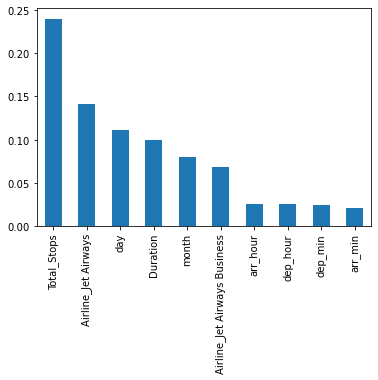

In [112]:
import matplotlib.pyplot as plt
ftrimp=pd.Series(model.feature_importances_,index=x.columns)
ftrimp.nlargest(10).plot(kind="bar")
plt.show()

In [113]:
xtr,xtest,ytr,ytest=train_test_split(x,y,random_state=50,test_size=.2)

In [114]:
print(xtr.shape,xtest.shape,ytr.shape,ytest.shape)

(8369, 38) (2093, 38) (8369,) (2093,)


In [115]:
model=Lasso(alpha=.05,random_state=10)

In [116]:
model.fit(xtr,ytr)

/Users/mufseeramusthafa/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 78250522.50390625, tolerance: 18087606.62911636
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.05, random_state=10)

In [117]:
ypred=model.predict(xtest)

In [118]:
model.score(xtr,ytr)


0.6386309832229301

In [119]:
model.score(xtest,ytest)

0.6362898254543274

In [120]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
model=RandomForestRegressor()
model.fit(xtr,ytr)

RandomForestRegressor()

In [121]:
model.score(xtr,ytr)

0.9526647023422685

In [122]:
model.score(xtest,ytest)

0.8202013476737682

In [123]:
from sklearn.kernel_ridge import KernelRidge

In [124]:
model=KernelRidge()

In [125]:
model.fit(xtr,ytr)

KernelRidge()

In [126]:
model.score(xtr,ytr)

0.6367366127291207

In [127]:
from sklearn.tree import DecisionTreeRegressor
dtmodel=DecisionTreeRegressor(max_depth=11)
dtmodel.fit(xtr,ytr)

DecisionTreeRegressor(max_depth=11)

In [128]:
dtmodel.score(xtr,ytr)

0.9020108914024477

In [129]:
dtmodel.score(xtest,ytest)

0.7817843825373311

In [130]:
import xgboost
reg=xgboost.XGBRegressor()
reg.fit(xtr,ytr)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [131]:
yprd=reg.predict(xtest)

In [132]:
%matplotlib inline
import seaborn as sns

/Users/mufseeramusthafa/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Price', ylabel='Density'>

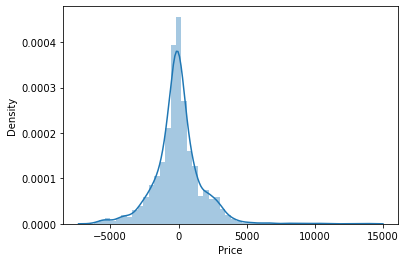

In [133]:
sns.distplot(ytest-yprd)

In [134]:
from sklearn import metrics
print("rsquare",np.sqrt(metrics.r2_score(ytest,yprd)))
print("MAE",metrics.mean_absolute_error(ytest,yprd))
print("MSE",metrics.mean_squared_error(ytest,yprd))
print("RMSE",np.sqrt(metrics.mean_squared_error(ytest,yprd)))

rsquare 0.9240028994677768
MAE 1161.8172910702156
MSE 2994019.9348843824
RMSE 1730.3236503279907


In [135]:
reg.score(xtr,ytr)

0.9372092687851393

In [136]:
reg.score(xtest,ytest)

0.8537813582248585

In [137]:
from sklearn.model_selection import RandomizedSearchCV
#no of trees in xgboost
n_est=[int(x) for x in np.linspace(100,1200,12)]
learning_rate=["0.05","0.1","0.2","0.3"]
#max no of level
max_depth=[int(x) for x in np.linspace(5,330,6)]
subsample=[.6,.7,.8]
min_child_weight=[3,4,5,6,7]


In [138]:
reg=xgboost.XGBRegressor()
params={"n_estimators":n_est,"learning_rate":learning_rate,"max_depth":max_depth,"subsample":subsample,"min_child_weight":min_child_weight}

In [139]:
model=RandomizedSearchCV(estimator=reg,param_distributions=params,n_iter=5,cv=5,verbose=2,random_state=42,n_jobs=-1)

In [140]:
model.fit(xtr,ytr)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
/Users/mufseeramusthafa/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done  23 out of  25 | elapsed:  4.5min remaining:   23.6s
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:  5.0min finished


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, gamma=None,
                                          gpu_id=None, importance_type='gain',
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n...
                                          scale_pos_weight=None, subsample=None,
                                          tree_method=None,
                                          validat

In [141]:
ypred=model.predict(xtest)

/Users/mufseeramusthafa/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Price', ylabel='Density'>

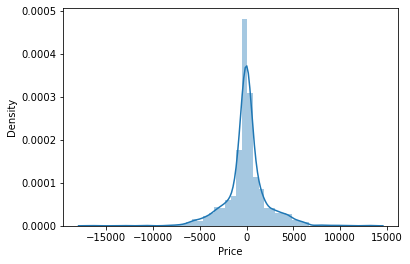

In [142]:
sns.distplot(ytest-ypred)

In [143]:
model.score(xtest,ytest)

0.7671849286447135

In [144]:
model.score(xtr,ytr)

0.9704753903139431

In [146]:
from sklearn.linear_model import BayesianRidge
regressor = BayesianRidge()  
regressor.fit(xtr,ytr)
print(regressor.score(xtr,ytr))
print(regressor.score(xtest,ytest))

0.6385995767052919
0.6365537753578683


In [147]:
from sklearn.ensemble import RandomForestRegressor

In [148]:
model=RandomForestRegressor()
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]

In [149]:
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

In [150]:
model=RandomizedSearchCV(estimator=model,param_distributions=random_grid,n_iter=10,cv=5,verbose=2,random_state=42,n_jobs=-1)

In [151]:
model.fit(xtr,ytr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   26.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   46.0s finished


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, verbose=2)

In [152]:
model.score(xtr,ytr)

0.9020442422180683

In [153]:
model.score(xtest,ytest)

0.8477378280121463

In [154]:

estimator = RandomForestRegressor()
param_distributions = { 
            "n_estimators"      : [100,300,500],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2,4,8],
            "bootstrap": [True,False],
            }

rfmodel = RandomizedSearchCV(estimator, param_distributions, n_jobs=-1, cv=5)
rfmodel.fit(xtr, ytr)

/Users/mufseeramusthafa/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_split': [2, 4, 8],
                                        'n_estimators': [100, 300, 500]})

In [155]:
rfmodel.score(xtest,ytest)

0.8336794146002563

In [156]:
rfmodel.score(xtr,ytr)

0.9276036615626777

In [157]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
min_child_width = [i for i in range(1,6,2)]
gamma = [i/10.0 for i in range(0,5)]
subsample = [i/10.0 for i in range(6,10)]
colsample_bytree=[i/10.0 for i in range(6,10)]
reg_alpha=[1e-5, 1e-2, 0.1, 1, 100]
learning_rate=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]

In [158]:
random_grid = {'n_estimators': n_estimators,
               
              'min_child_weight':min_child_width,
              'gamma':gamma,
               'subsample':subsample,
               'colsample_bytree':colsample_bytree,
               'reg_alpha':reg_alpha,
               'learning_rate': learning_rate
              }


In [159]:
import xgboost
from xgboost.sklearn import XGBClassifier,XGBRegressor
XG = XGBRegressor()

In [160]:
XG_random = RandomizedSearchCV(estimator=XG,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,random_state=42,n_jobs=-1)

In [ ]:
# XG_random.fit(xtr,ytr)

In [162]:
from sklearn.svm import SVR
regressor=SVR(kernel='linear',degree=1)
regressor.fit(xtr,ytr)

SVR(degree=1, kernel='linear')

In [163]:
regressor.score(xtest,ytest)

0.4000781441016992

In [164]:
from sklearn.decomposition import PCA

In [168]:
pca=PCA(.99)

In [169]:
xtr1=pca.fit_transform(xtr)
xt1=pca.transform(xtest)

In [170]:
pca.n_components_

1

In [174]:
from sklearn.linear_model import LogisticRegression
model=LogisticRegression()
model.fit(xtr,ytr)

/Users/mufseeramusthafa/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [175]:
model.score(xtest,ytest)

0.048733874820831344